# Reward Training vs. Reward Competiton - Peak Detection

In [2]:
import sys
import os

PROJECT_ROOT = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.append(PROJECT_ROOT)

from Reward_Training.rt_extension import Reward_Training
from Reward_Competition.rc_extension import Reward_Competition
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from scipy.signal import find_peaks


In [1]:
# Reward Competition files
experiment_path = r"D:\PadillaCoreanoLab\Reward_Competition\combined_cohorts"

csv_path = r"D:\PadillaCoreanoLab\Reward_Competition\combined_cohorts\manual_scoring_combined.xlsx"

# experiment_path = r"C:\Users\alber\OneDrive\Desktop\PC_Lab\Photometry\Pilot_2\Combined_Cohorts\Reward_Competition\Test"

In [3]:
# Reward Training files
# NAc
rt_NAc_experiment_path = r"D:\PadillaCoreanoLab\Reward_Training\Combined\Day10\NAc"
nac_color = '#15616F'

# mPFC
rt_mPFC_experiment_path = r"D:\PadillaCoreanoLab\Reward_Training\Combined\Day10\mPFC"
mPFC_color = '#FFAF00'


### Reward Competition Pre-processing

In [4]:
# rc_exp = Reward_Competition(experiment_folder_path=experiment_path, behavior_folder_path=None)
# rc_exp.rtc_processing()
# rc_exp.read_and_merge_manual_scoring(csv_path)
# rc_exp.remove_tangles()   # Remove sound cues and winner array indexes where there are tangles
# rc_exp.remove_specified_subjects()   # Remove specified subjects from the analysis
# rc_exp.extract_da_columns()   # Grab only essential columns for analysis
# rc_exp.find_first_port_entry_after_sound_cue()
# rc_exp.compute_EI_DA()
# rc_exp.compute_rtc_da_metrics().head()
# rc_exp.split_by_winner()

### Reward Training Pre-processing

In [4]:
rt_NAc_exp = Reward_Training(experiment_folder_path=rt_NAc_experiment_path, behavior_folder_path=None)
rt_mPFC_exp = Reward_Training(experiment_folder_path=rt_mPFC_experiment_path, behavior_folder_path=None)

Found Synapse note file: D:\PadillaCoreanoLab\Reward_Training\Combined\Day10\NAc\n5-240911-062153\Notes.txt
read from t=0s to t=1769.26s
Found Synapse note file: D:\PadillaCoreanoLab\Reward_Training\Combined\Day10\NAc\n7-240911-111928\Notes.txt
read from t=0s to t=1688.06s
read from t=0s to t=3853.09s
read from t=0s to t=3853.09s
read from t=0s to t=3851.18s
read from t=0s to t=3851.18s
read from t=0s to t=3845.28s
read from t=0s to t=3845.28s
read from t=0s to t=3845.28s
read from t=0s to t=3845.28s
Found Synapse note file: D:\PadillaCoreanoLab\Reward_Training\Combined\Day10\mPFC\p1-240607-065311\Notes.txt
read from t=0s to t=1684.75s
Found Synapse note file: D:\PadillaCoreanoLab\Reward_Training\Combined\Day10\mPFC\p2-240607-092425\Notes.txt
read from t=0s to t=1761.77s
Found Synapse note file: D:\PadillaCoreanoLab\Reward_Training\Combined\Day10\mPFC\p3-240607-115203\Notes.txt
read from t=0s to t=1753.91s
Found Synapse note file: D:\PadillaCoreanoLab\Reward_Training\Combined\Day10\mPF

In [5]:
def run_rtc_pipeline(exp, experiment_path):
    exp.rtc_processing()
    exp.create_base_df(experiment_path)
    exp.remove_specified_subjects()
    exp.extract_da_columns()
    exp.find_first_port_entry_after_sound_cue()
    # exp.compute_closest_port_offset(
    #     PE_column='first_PE_after_sound_cue',
    #     offset_column='filtered_port_entry_offset'
    # )Reward_Training-Competition/RT_vs_RC/rt_vs_rc_Peak_Detection.ipynb
    exp.compute_EI_DA()
    exp.compute_rtc_da_metrics()

run_rtc_pipeline(rt_NAc_exp, rt_NAc_experiment_path)
run_rtc_pipeline(rt_mPFC_exp, rt_mPFC_experiment_path)

Processing trial n5-240911-062153...
Processing trial n7-240911-111928...
Processing trial nn1-250202-133348...
Processing trial nn2-250202-133348...
Processing trial nn3-250202-122021...
Processing trial nn4-250202-122021...
Processing trial nn5-250202-082015...
Processing trial nn6-250202-082015...
Processing trial nn7-250202-070333...
Processing trial nn8-250202-070333...
Processing trial p1-240607-065311...
Processing trial p2-240607-092425...
Processing trial p3-240607-115203...
Processing trial p5-240911-050744...
Processing trial p6-240911-073819...
Processing trial p7-240911-100647...
Processing trial p8-240911-123255...
Processing trial pp1-250202-105839...
Processing trial pp2-250202-105839...
Processing trial pp3-250202-093829...
Processing trial pp4-250202-093829...
Processing trial pp5-250202-054445...
Processing trial pp6-250202-054445...
Processing trial pp7-250202-042018...
Processing trial pp8-250202-042018...


In [35]:
rt_mPFC_exp.da_df.head(1)

,subject_name,file name,trial,filtered_sound_cues,filtered_port_entries,filtered_port_entry_offset,first_PE_after_sound_cue,Tone_Time_Axis,Tone_Zscore,PE_Time_Axis,PE_Zscore,Tone AUC,Tone Max Peak,Tone Time of Max Peak,Tone Mean Z-score,PE AUC,PE Max Peak,PE Time of Max Peak,PE Mean Z-score
0,p1,p1-240607-065311,<trial_class.Trial object at 0x00000276D3370DD0>,"[240.10817536, 320.10878976, 320.87261184, 410...","[180.86756352, 187.53765376, 192.4677632, 196....","[182.88771072, 189.1278848, 195.10771712, 199....","[244.10817536, 324.10878976, 324.87261184, 414...","[[-4.0, -3.9990169600200716, -3.99803392004014...","[[-0.20536349846839275, -0.20588530442975184, ...","[[0.0, 0.000983039979928435, 0.001966079959856...","[[0.013460335827420344, 0.012645267243988996, ...","[-0.4182093930553551, -1.2752506173406197, -2....","[0.061707258184447944, 0.07610211770755722, -0...","[3.9301835180826856, 0.0009727183087306912, 0....","[-0.10456869213287281, -0.3188453569747004, -0...","[-0.7918342482463429, -0.9761212372192243, -1....","[0.12308673316377684, -0.06616273348692978, -0...","[3.2184728942856964, 3.5713842470800046, 2.807...","[-0.19791931282500247, -0.24403869820423368, -..."


In [36]:
import numpy as np
import matplotlib.pyplot as plt

def plot_raw_dff_with_first_PE(
    da_df: pd.DataFrame,
    time_window:       tuple = (0, 60),
    region:            str   = None,    # 'NAc', 'mPFC' or None
    figsize_per_trace: tuple = (12, 2),
    dff_color:         str   = 'black',
    pe_line_color:     str   = 'magenta',
    pe_line_style:     str   = ':',
    pe_line_alpha:     float = 0.7
):
    """
    One ΔF/F trace per session, with a vertical line at each
    first_PE_after_sound_cue time.

    da_df must contain:
      - 'subject_name'
      - 'file name'
      - 'trial' (with .timestamps array)
      - 'first_PE_after_sound_cue' (list or array of times)
      - 'dFF' (or .dFF on trial)
    """
    t0, t1 = time_window

    # 1) pick rows, optional region‐filter
    df = da_df
    if region is not None:
        prefix = 'n' if region=='NAc' else 'p'
        df = df[df['subject_name'].str.startswith(prefix)]
    if df.empty:
        print("No sessions for region", region)
        return

    # 2) one subplot per session
    n = len(df)
    fig, axes = plt.subplots(n, 1,
                             figsize=(figsize_per_trace[0],
                                      figsize_per_trace[1]*n),
                             sharex=False)
    if n==1:
        axes = [axes]

    # 3) loop
    for ax, (_, row) in zip(axes, df.iterrows()):
        # get time & dFF
        tr     = row['trial']
        ts_all = np.asarray(tr.timestamps, dtype=float)
        # either stored on trial or in row:
        if hasattr(tr, 'dFF'):
            dff_all = np.asarray(tr.dFF, dtype=float)
        else:
            dff_all = np.asarray(row['dFF'], dtype=float)

        # crop to window
        mask = (ts_all >= t0) & (ts_all <= t1)
        ts  = ts_all[mask]
        dff = dff_all[mask]

        ax.plot(ts, dff, color=dff_color, lw=1.2)

        # overlay first-PE times
        pes = row.get('first_PE_after_sound_cue') or []
        # if it's an array, turn it into a python list:
        if isinstance(pes, np.ndarray):
            pes = pes.tolist()
        for p in pes:
            try:
                pf = float(p)
            except:
                continue
            if pf < t0 or pf > t1:
                continue
            ax.axvline(pf,
                       color=pe_line_color,
                       linestyle=pe_line_style,
                       alpha=pe_line_alpha,
                       lw=1)

        ax.set_xlim(t0, t1)
        ax.set_ylabel("ΔF/F")
        ax.set_title(f"{row['file name']} ({row['subject_name']})", fontsize=9)

    axes[-1].set_xlabel("Time (s)")
    plt.tight_layout()
    plt.show()


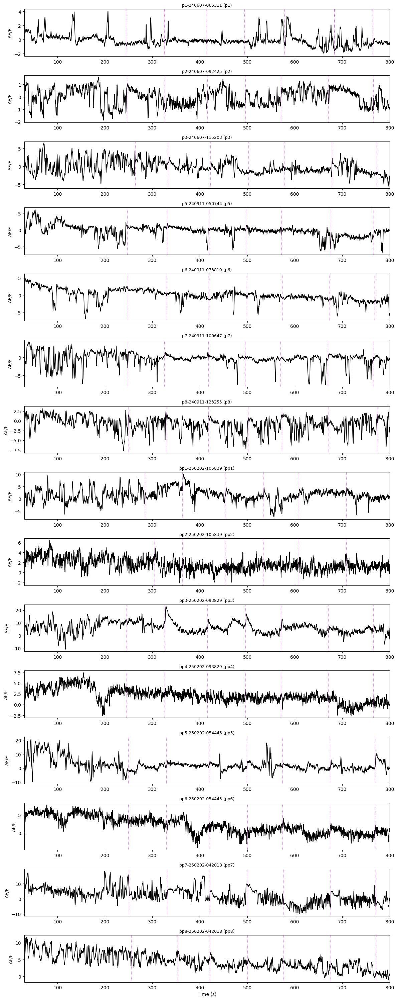

In [38]:
# # plot NAc sessions, from 30→800 s:
# plot_raw_dff_with_first_PE(
#     rt_NAc_exp.da_df,
#     time_window=(30,800),
#     region='NAc'
# )

# plot mPFC sessions likewise:
plot_raw_dff_with_first_PE(
    rt_mPFC_exp.da_df,
    time_window=(30,800),
    region='mPFC'
)


In [44]:
import numpy as np
import matplotlib.pyplot as plt

def plot_DA_ISOS_and_dFF_with_firstPE(
    experiment,
    time_window:       tuple = (0, 60),
    region:            str   = None,       # 'NAc', 'mPFC' or None for all
    figsize_per_trial: tuple = (12, 4),
    da_color:          str   = 'tab:blue',
    isos_color:        str   = 'tab:gray',
    dff_color:         str   = 'tab:green',
    pe_line_color:     str   = 'magenta',
    pe_line_style:     str   = ':',
    pe_line_alpha:     float = 0.7
):
    """
    Two‐panel per trial: 
      • Top: high‐pass DA & ISOS 
      • Bottom: raw ΔF/F 
    with dashed lines at each first_PE_after_sound_cue.
    
    `experiment.trials` must map file_name → Trial,
     and `experiment.da_df` must have a row per file_name with
     a column 'first_PE_after_sound_cue' (list of floats).
    """
    t0, t1 = time_window

    # 1) Build list of (file_name, trial) and apply region filter
    items = list(experiment.trials.items())
    if region is not None:
        prefix = 'n' if region=='NAc' else 'p'
        items = [(fn,tr) for fn,tr in items
                 if hasattr(tr,'subject_name') and tr.subject_name.startswith(prefix)]
    if not items:
        print("No trials to plot.")
        return

    # 2) Quick lookup of your da_df by file name
    df = experiment.da_df.set_index('file name')

    for fname, tr in items:
        if fname not in df.index:
            # no port‐entry data for this file, skip
            continue
        row = df.loc[fname]

        # pull out the PE times
        pes = row.get('first_PE_after_sound_cue') or []
        # normalize numpy arrays → python lists
        if isinstance(pes, np.ndarray):
            pes = pes.tolist()

        # 3) get the traces & crop to window
        ts_full  = np.asarray(tr.timestamps,    dtype=float)
        da_full  = np.asarray(tr.updated_DA,    dtype=float)
        iso_full = np.asarray(tr.isosbestic_fitted,  dtype=float)
        dff_full = np.asarray(tr.dFF,           dtype=float)

        mask = (ts_full >= t0) & (ts_full <= t1)
        ts, da, iso, dff = ts_full[mask], da_full[mask], iso_full[mask], dff_full[mask]

        # 4) make the figure with two stacked panels
        fig, (ax1,ax2) = plt.subplots(2,1, sharex=True,
                                      figsize=(figsize_per_trial[0],
                                               figsize_per_trial[1]*2))

        # — Top panel: DA & ISOS —
        ax1.plot(ts, da,  color=da_color,  lw=1.5, label='DA (HP)')
        ax1.plot(ts, iso, color=isos_color, lw=1.5, label='ISOS (HP)')
        ax1.set_ylabel("Signal")
        ax1.legend(fontsize=8)

        # — Bottom panel: raw ΔF/F —
        ax2.plot(ts, dff, color=dff_color, lw=1.5, label='ΔF/F')
        ax2.set_ylabel("ΔF/F")
        ax2.legend(fontsize=8)

        # — Dashed lines at first-PE times —
        for p in pes:
            try:
                p = float(p)
            except:
                continue
            if p < t0 or p > t1:
                continue
            ax1.axvline(p,
                        color=pe_line_color,
                        linestyle=pe_line_style,
                        alpha=pe_line_alpha,
                        lw=1)
            ax2.axvline(p,
                        color=pe_line_color,
                        linestyle=pe_line_style,
                        alpha=pe_line_alpha,
                        lw=1)

        ax2.set_xlabel("Time (s)")
        ax1.set_title(f"{fname} ({tr.subject_name})", fontsize=10)

        plt.tight_layout()
        plt.show()


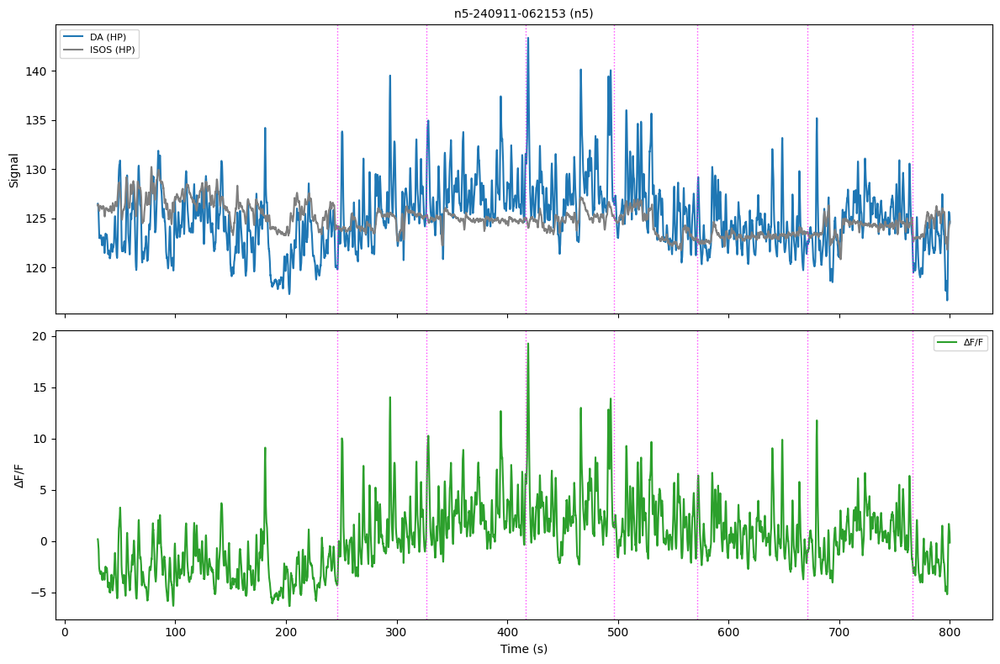

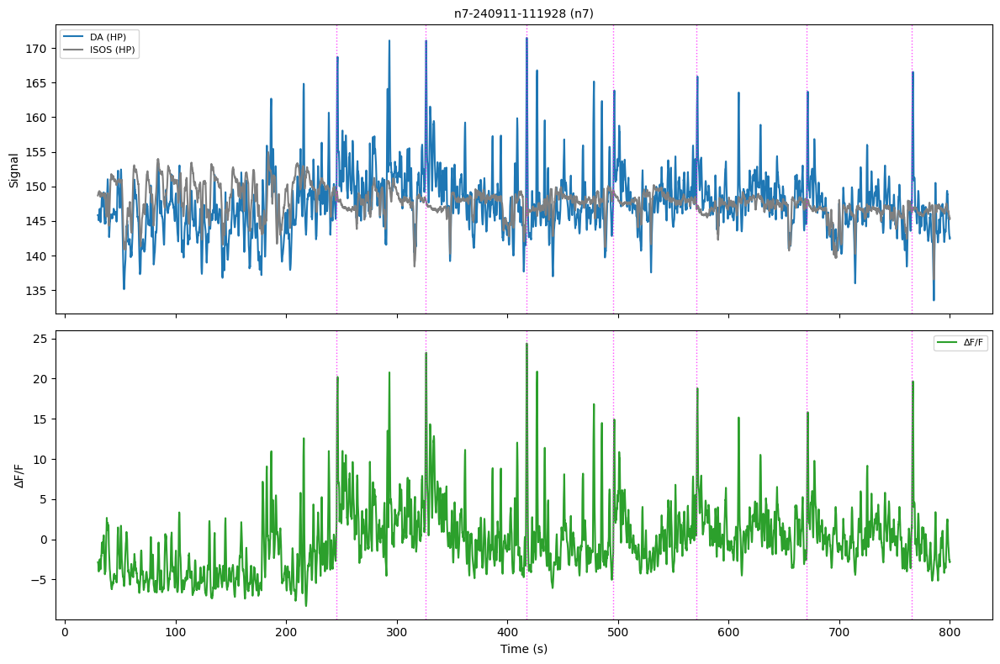

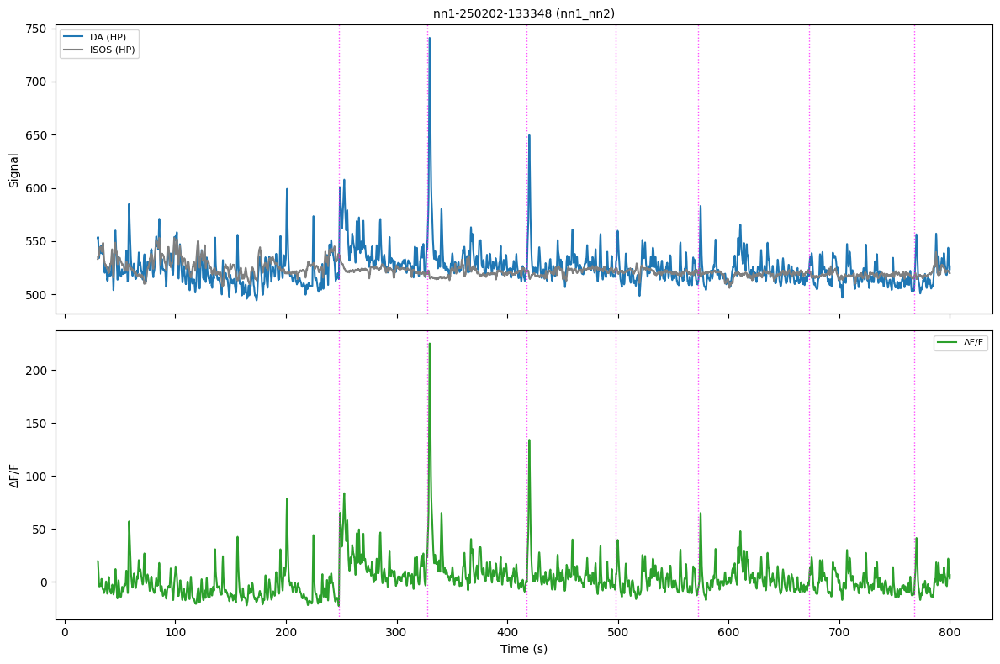

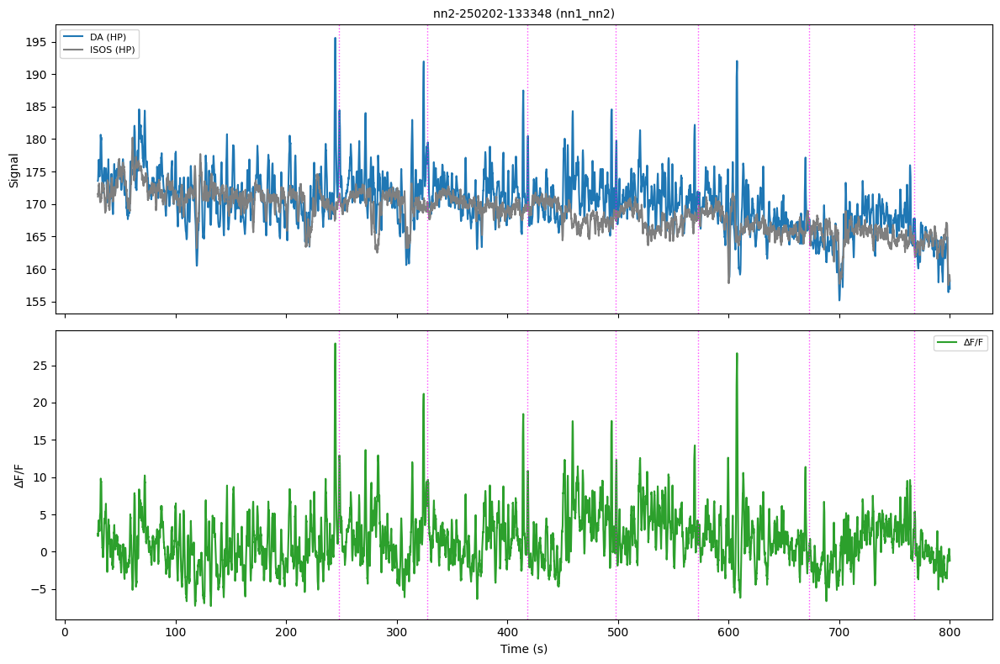

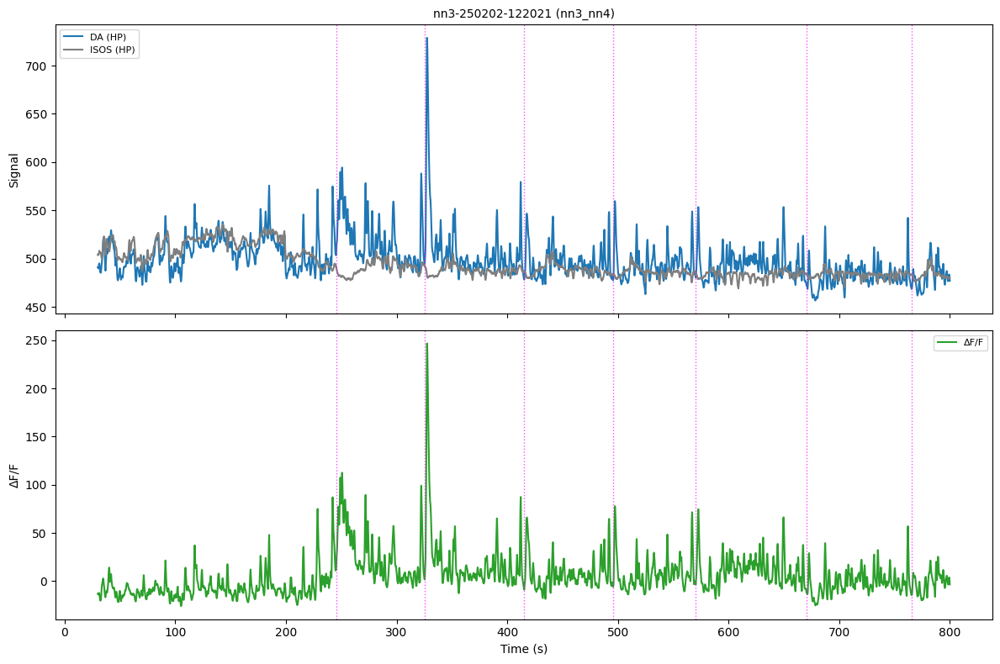

...

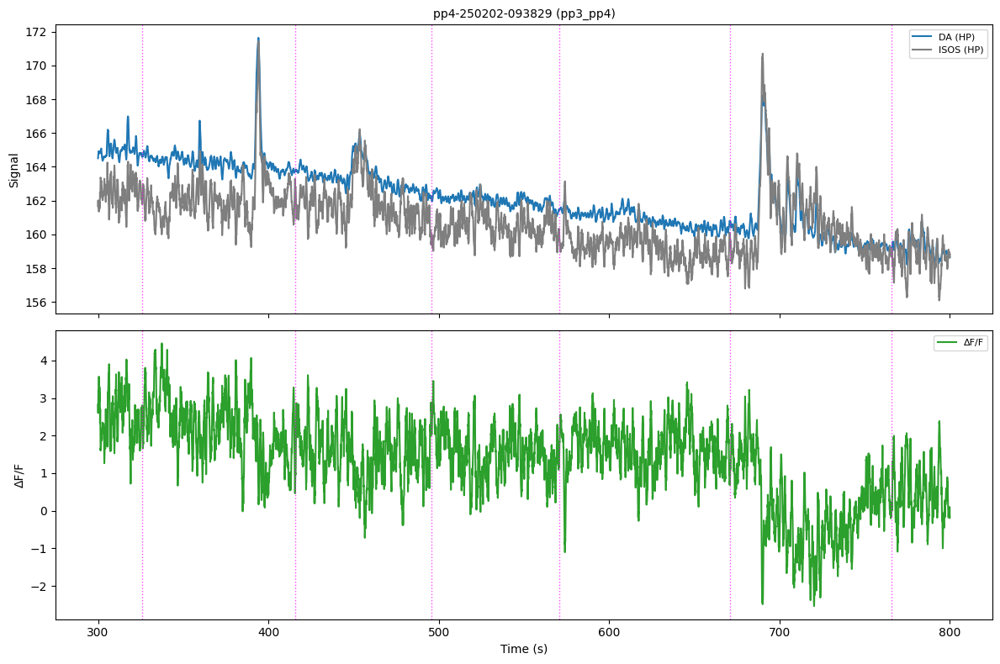

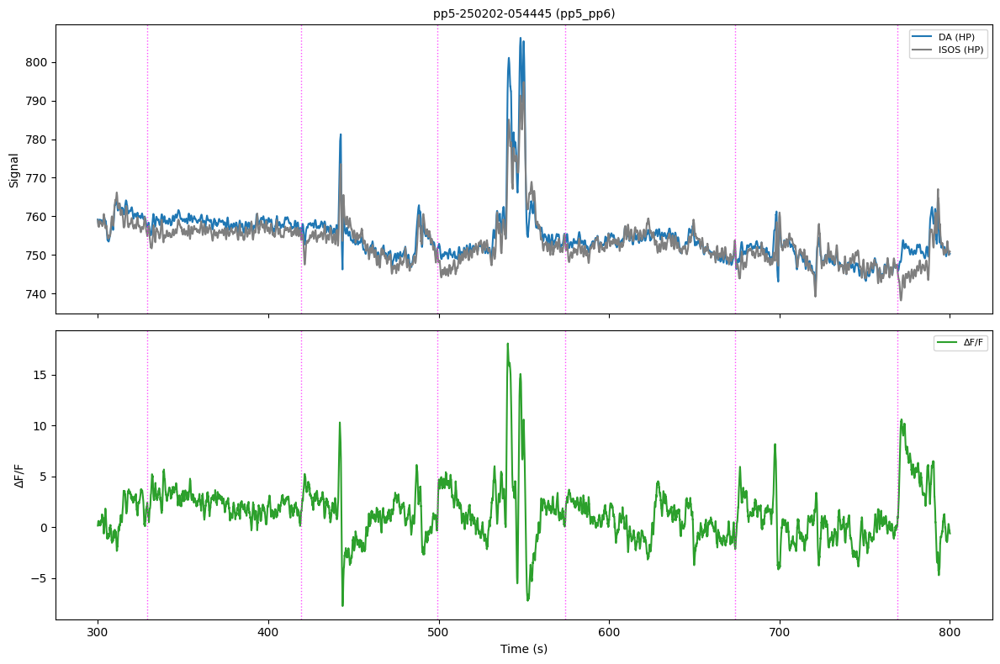

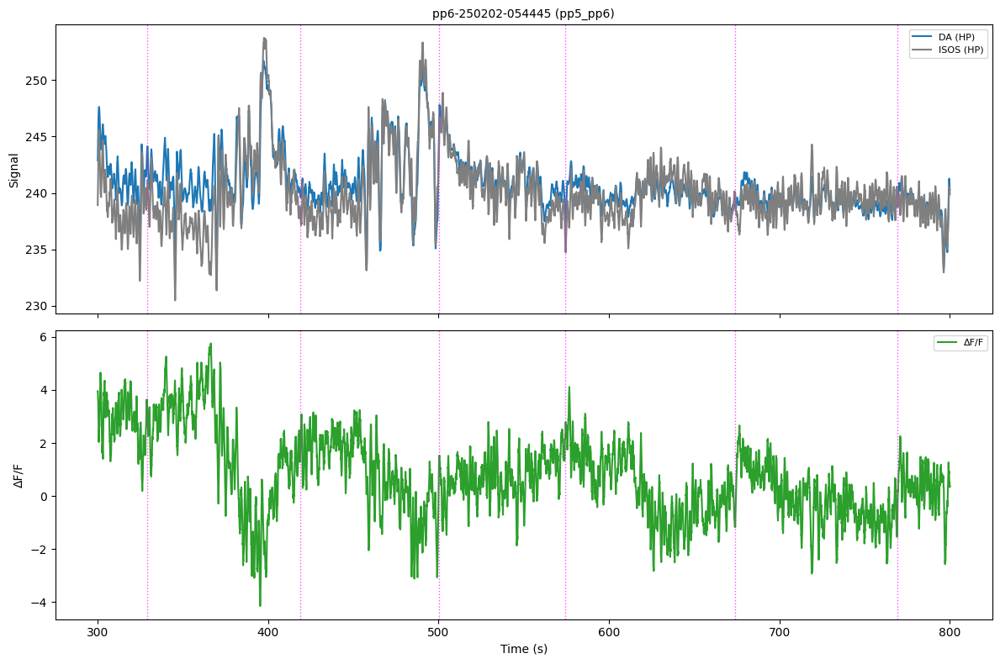

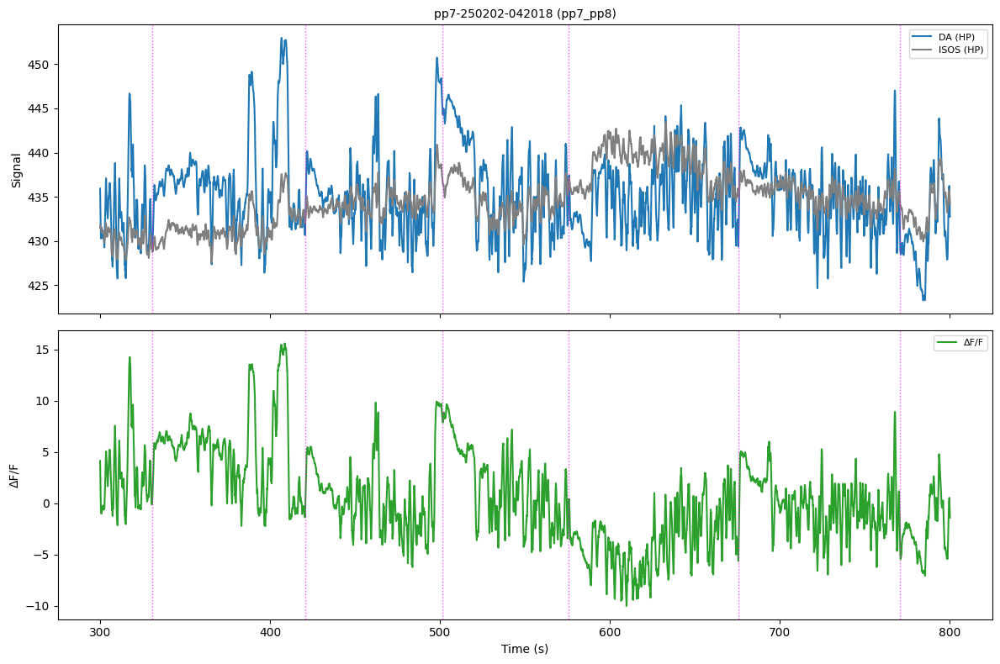

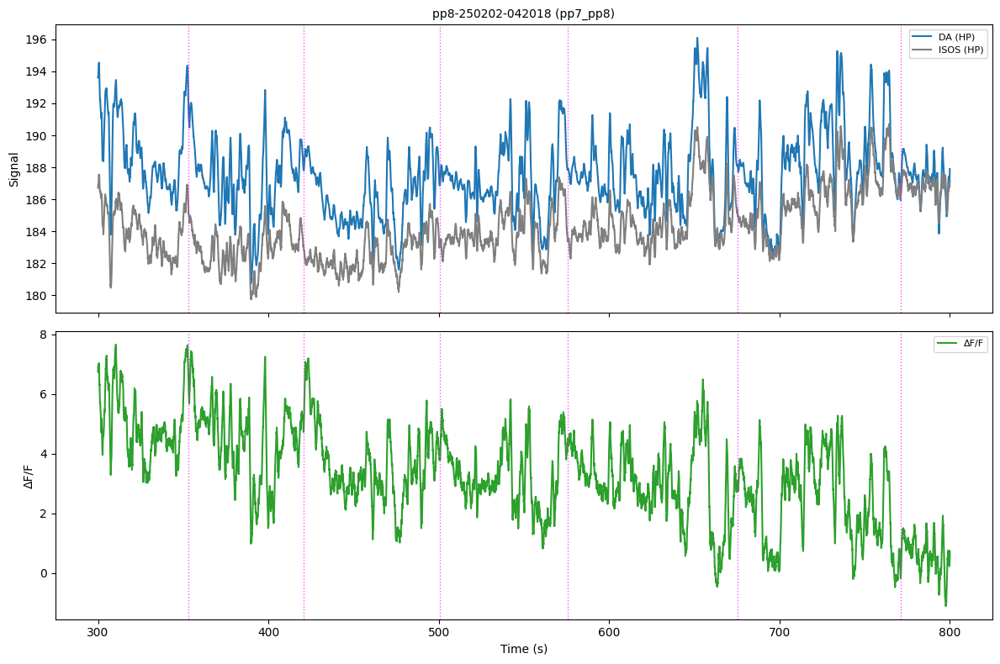

In [47]:
plot_DA_ISOS_and_dFF_with_firstPE(
    rt_NAc_exp,
    time_window=(30,800),
    region='NAc'
)

plot_DA_ISOS_and_dFF_with_firstPE(
    rt_mPFC_exp,
    time_window=(300,800),
    region='mPFC'
)


In [9]:
import numpy as np
import matplotlib.pyplot as plt

def plot_raw_dff_from_experiment(
    experiment,
    time_window: tuple = (0, 60),
    region:       str   = None,    # 'NAc', 'mPFC', or None for all
    figsize_per_trace: tuple = (12, 2),
    color:        str   = 'black'
):
    """
    For each Trial in experiment.trials, plot its raw ΔF/F (trial.dFF)
    between time_window[0] and time_window[1] seconds.
    
    Parameters
    ----------
    experiment : your Reward_Competition instance
      Must have `experiment.trials` dict mapping file_name → Trial
    time_window : (t0, t1) in seconds
    region : 'NAc', 'mPFC', or None
      If specified, only trials whose trial.subject_name startswith 'n' (NAc)
      or 'p' (mPFC) will be shown.
    figsize_per_trace : (width, height) per subplot row
    color : line color for ΔF/F
    """
    t0, t1 = time_window

    # 1) assemble the list of (name, trial) pairs, with optional region filter
    all_trials = list(experiment.trials.items())
    if region is not None:
        prefix = 'n' if region == 'NAc' else 'p'
        all_trials = [
            (name, tr) for name, tr in all_trials
            if tr.subject_name.startswith(prefix)
        ]
    if not all_trials:
        print("No trials to plot (region filter may be too strict).")
        return

    # 2) set up subplots: one row per trial
    n = len(all_trials)
    fig, axes = plt.subplots(n, 1,
                             figsize=(figsize_per_trace[0],
                                      figsize_per_trace[1]*n),
                             sharex=False)
    if n == 1:
        axes = [axes]

    # 3) loop and plot
    for ax, (fname, tr) in zip(axes, all_trials):
        # get timestamps and raw dFF
        ts_full = np.asarray(tr.timestamps, dtype=float)
        # replace `tr.dFF` with the correct attribute if yours differs
        dff_full = np.asarray(tr.dFF, dtype=float)

        # mask to the desired window
        mask = (ts_full >= t0) & (ts_full <= t1)
        ts = ts_full[mask]
        dff = dff_full[mask]

        ax.plot(ts, dff, color=color, lw=1)
        ax.set_xlim(t0, t1)
        ax.set_ylabel("ΔF/F", fontsize=9)
        ax.set_title(f"{fname} ({tr.subject_name})", fontsize=10)

    axes[-1].set_xlabel("Time (s)", fontsize=10)
    plt.tight_layout()
    plt.show()


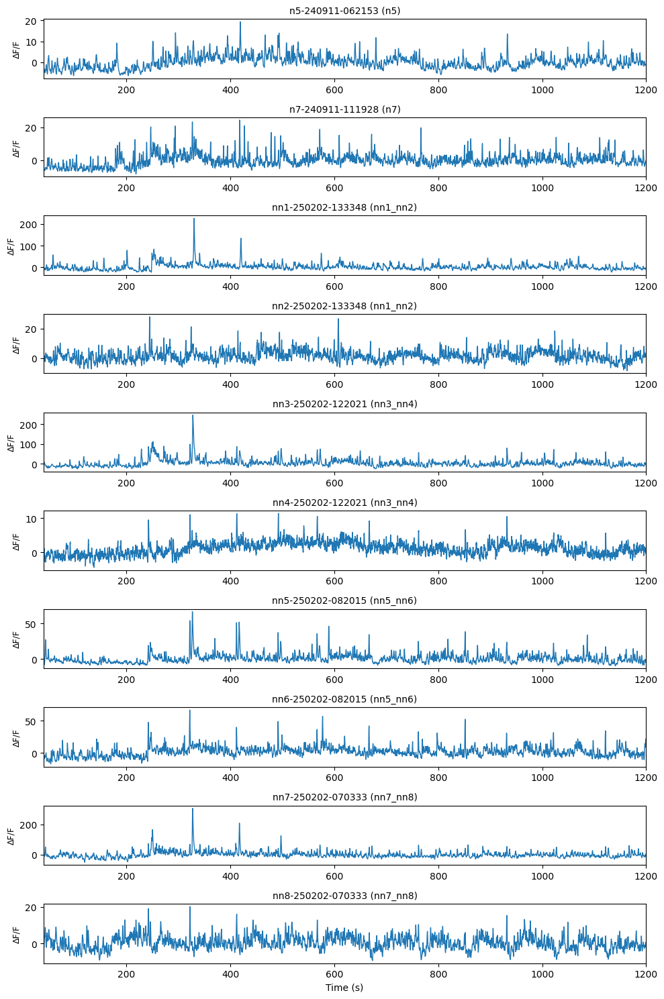

In [10]:
# plot 0→120 s of every mPFC session in blue:
plot_raw_dff_from_experiment(
    rt_NAc_exp,                 # your Reward_Competition instance
    time_window=(40, 1200),
    region="NAc",
    color="tab:blue",
    figsize_per_trace=(10, 1.5)
)


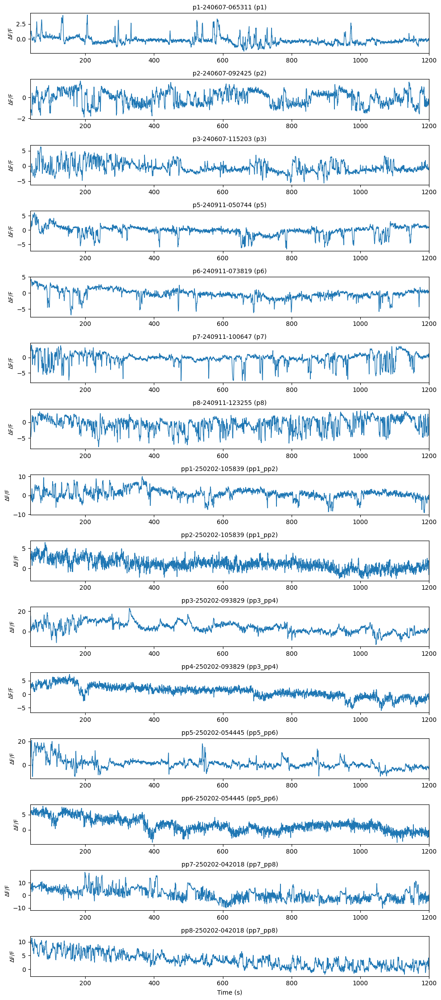

In [11]:
# plot 0→120 s of every mPFC session in blue:
plot_raw_dff_from_experiment(
    rt_mPFC_exp,                 # your Reward_Competition instance
    time_window=(40, 1200),
    region="mPFC",
    color="tab:blue",
    figsize_per_trace=(10, 1.5)
)


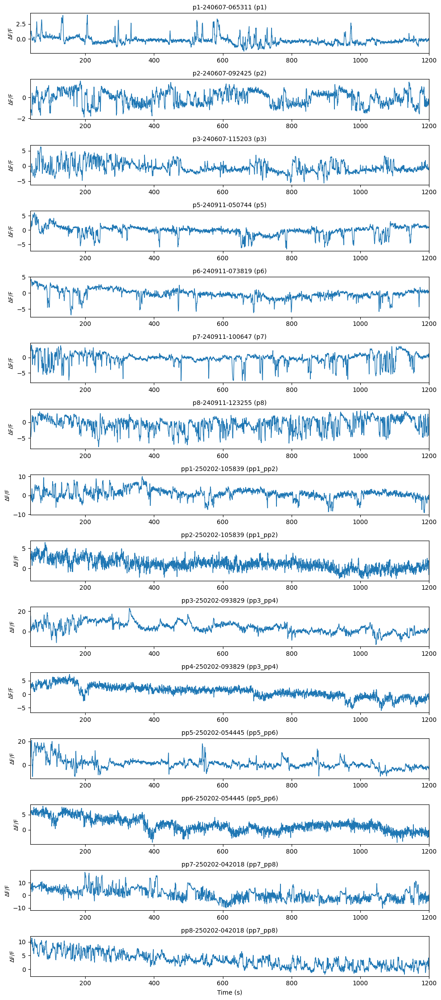

In [12]:
# plot 0→120 s of every mPFC session in blue:
plot_raw_dff_from_experiment(
    rt_mPFC_exp,                 # your Reward_Competition instance
    time_window=(40, 1200),
    region="mPFC",
    color="tab:blue",
    figsize_per_trace=(10, 1.5)
)


In [13]:
import numpy as np
import matplotlib.pyplot as plt

def plot_DA_and_ISOS_from_experiment(
    experiment,
    time_window: tuple = (0, 60),
    region:       str   = None,     # 'NAc', 'mPFC' or None
    figsize_per_trace: tuple = (12, 2),
    da_color:     str   = 'tab:blue',
    isos_color:   str   = 'tab:gray'
):
    """
    For each Trial in experiment.trials, plot its high-pass filtered DA
    and isosbestic traces between time_window[0] and time_window[1] seconds.

    experiment.trials should be a dict: {file_name: Trial, ...}
    Each Trial must have:
      - .timestamps     : 1D array of seconds
      - .updated_DA     : 1D array of the DA trace (high-pass or dFF)
      - .updated_ISOS   : 1D array of the isosbestic trace

    If `region` is 'NAc' or 'mPFC', it will only plot those whose
    Trial.subject_name startswith 'n' or 'p' respectively.
    """
    t0, t1 = time_window

    # collect trials, with optional region filter
    items = list(experiment.trials.items())
    if region is not None:
        prefix = 'n' if region=='NAc' else 'p'
        items = [(fn, tr) for fn, tr in items if tr.subject_name.startswith(prefix)]
    if not items:
        print("No trials to plot (check your region filter).")
        return

    # make one subplot per trial
    n = len(items)
    fig, axes = plt.subplots(n, 1,
                             figsize=(figsize_per_trace[0],
                                      figsize_per_trace[1]*n),
                             sharex=False)
    if n==1:
        axes = [axes]

    for ax, (fname, tr) in zip(axes, items):
        ts_full = np.asarray(tr.timestamps, dtype=float)
        da_full = np.asarray(tr.updated_DA,   dtype=float)
        iso_full= np.asarray(tr.isosbestic_fitted, dtype=float)

        # slice to window
        mask = (ts_full>=t0)&(ts_full<=t1)
        ts  = ts_full[mask]
        da  = da_full[mask]
        iso = iso_full[mask]

        ax.plot(ts, da,  color=da_color,  lw=1.5, label='DA')
        ax.plot(ts, iso, color=isos_color,lw=1.5, label='ISOS')

        ax.set_xlim(t0, t1)
        ax.set_ylabel("Signal", fontsize=9)
        ax.set_title(f"{fname} ({tr.subject_name})", fontsize=10)
        ax.legend(loc='upper right', fontsize=8)

    axes[-1].set_xlabel("Time (s)", fontsize=10)
    plt.tight_layout()
    plt.show()


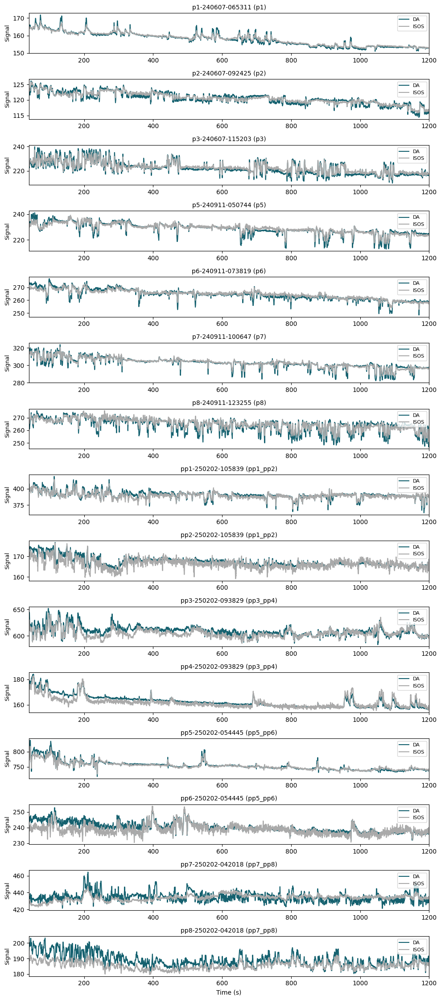

In [14]:
# plot 30→90 s of every NAc session, DA in blue and ISOS in gray
plot_DA_and_ISOS_from_experiment(
    rt_mPFC_exp,

    time_window=(40,1200),
    region='mPFC',
    figsize_per_trace=(10,1.5),
    da_color='#15616F',
    isos_color='#AAAAAA'
)


In [15]:
# # plot 30→90 s of every NAc session, DA in blue and ISOS in gray
# plot_DA_and_ISOS_from_experiment(
#     rt_NAc_exp,
#     time_window=(40,1200),
#     region='NAc',
#     figsize_per_trace=(10,1.5),
#     da_color='#15616F',
#     isos_color='#AAAAAA'
# )


In [16]:
import numpy as np
import matplotlib.pyplot as plt

def plot_ISOS_from_experiment(
    experiment,
    time_window: tuple = (0, 60),
    region:       str   = None,     # 'NAc', 'mPFC' or None
    figsize_per_trace: tuple = (12, 2),
    isos_color:   str   = 'tab:gray',
    y_step:       float = 10.0      # **here** you pick your y‐tick spacing
):
    t0, t1 = time_window

    # filter trials by region
    items = list(experiment.trials.items())
    if region is not None:
        prefix = 'n' if region=='NAc' else 'p'
        items = [(fn, tr) for fn, tr in items if tr.subject_name.startswith(prefix)]
    if not items:
        print("No trials to plot.")
        return

    # one row per trial
    n = len(items)
    fig, axes = plt.subplots(n, 1,
                             figsize=(figsize_per_trace[0],
                                      figsize_per_trace[1]*n),
                             sharex=False)
    if n == 1:
        axes = [axes]

    for ax, (fname, tr) in zip(axes, items):
        ts = np.asarray(tr.timestamps, dtype=float)
        iso = np.asarray(tr.updated_ISOS, dtype=float)

        # slice
        mask = (ts>=t0)&(ts<=t1)
        ts, iso = ts[mask], iso[mask]

        ax.plot(ts, iso, color=isos_color, lw=1.5)
        ax.set_xlim(t0, t1)
        ax.set_title(f"{fname} ({tr.subject_name})", fontsize=10)

        # now fix y-ticks every y_step
        ymin, ymax = ax.get_ylim()
        # round limits outwards to multiples of y_step
        lo = np.floor(ymin / y_step) * y_step
        hi = np.ceil (ymax / y_step) * y_step
        ax.set_ylim(lo, hi)
        ax.set_yticks(np.arange(lo, hi + 1e-6, y_step))

        ax.set_ylabel("ISOS", fontsize=9)

    axes[-1].set_xlabel("Time (s)", fontsize=10)
    plt.tight_layout()
    plt.show()


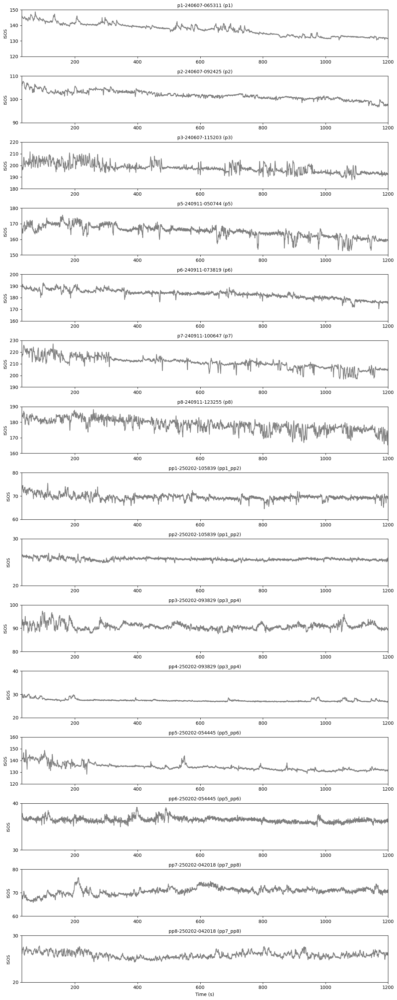

In [17]:
# plot only isosbestic, from 30→90 s, ticks every 10 units on y-axis
plot_ISOS_from_experiment(
    rt_mPFC_exp,
    time_window=(30,1200),
    region='mPFC',
    y_step=10
)


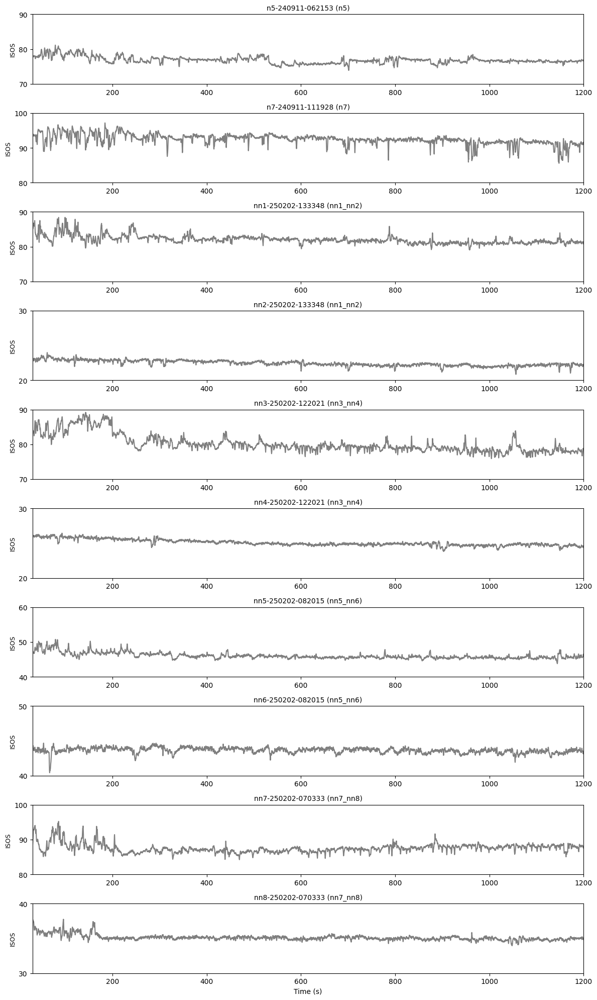

In [18]:
# plot only isosbestic, from 30→90 s, ticks every 10 units on y-axis
plot_ISOS_from_experiment(
    rt_NAc_exp,
    time_window=(30,1200),
    region='NAc',
    y_step=10
)


In [19]:
import numpy as np
import matplotlib.pyplot as plt

def plot_DA_and_ISOS_from_experiment(
    experiment,
    time_window: tuple = (0, 60),
    region:       str   = None,     # 'NAc', 'mPFC' or None
    figsize_per_trace: tuple = (12, 2),
    da_color:     str   = 'tab:blue',
    isos_color:   str   = 'tab:gray'
):
    """
    For each Trial in experiment.trials, plot its high-pass filtered DA
    and isosbestic traces between time_window[0] and time_window[1] seconds.

    experiment.trials should be a dict: {file_name: Trial, ...}
    Each Trial must have:
      - .timestamps     : 1D array of seconds
      - .updated_DA     : 1D array of the DA trace (high-pass or dFF)
      - .updated_ISOS   : 1D array of the isosbestic trace

    If `region` is 'NAc' or 'mPFC', it will only plot those whose
    Trial.subject_name startswith 'n' or 'p' respectively.
    """
    t0, t1 = time_window

    # collect trials, with optional region filter
    items = list(experiment.trials.items())
    if region is not None:
        prefix = 'n' if region=='NAc' else 'p'
        items = [(fn, tr) for fn, tr in items if tr.subject_name.startswith(prefix)]
    if not items:
        print("No trials to plot (check your region filter).")
        return

    # make one subplot per trial
    n = len(items)
    fig, axes = plt.subplots(n, 1,
                             figsize=(figsize_per_trace[0],
                                      figsize_per_trace[1]*n),
                             sharex=False)
    if n==1:
        axes = [axes]

    for ax, (fname, tr) in zip(axes, items):
        ts_full = np.asarray(tr.timestamps, dtype=float)
        da_full = np.asarray(tr.updated_DA,   dtype=float)
        # iso_full= np.asarray(tr.updated_ISOS, dtype=float)

        # slice to window
        mask = (ts_full>=t0)&(ts_full<=t1)
        ts  = ts_full[mask]
        da  = da_full[mask]
        # iso = iso_full[mask]

        ax.plot(ts, da,  color=da_color,  lw=1.5, label='DA')
        # ax.plot(ts, iso, color=isos_color,lw=1.5, label='ISOS')

        ax.set_xlim(t0, t1)
        ax.set_ylabel("Signal", fontsize=9)
        ax.set_title(f"{fname} ({tr.subject_name})", fontsize=10)
        ax.legend(loc='upper right', fontsize=8)

    axes[-1].set_xlabel("Time (s)", fontsize=10)
    plt.tight_layout()
    plt.show()


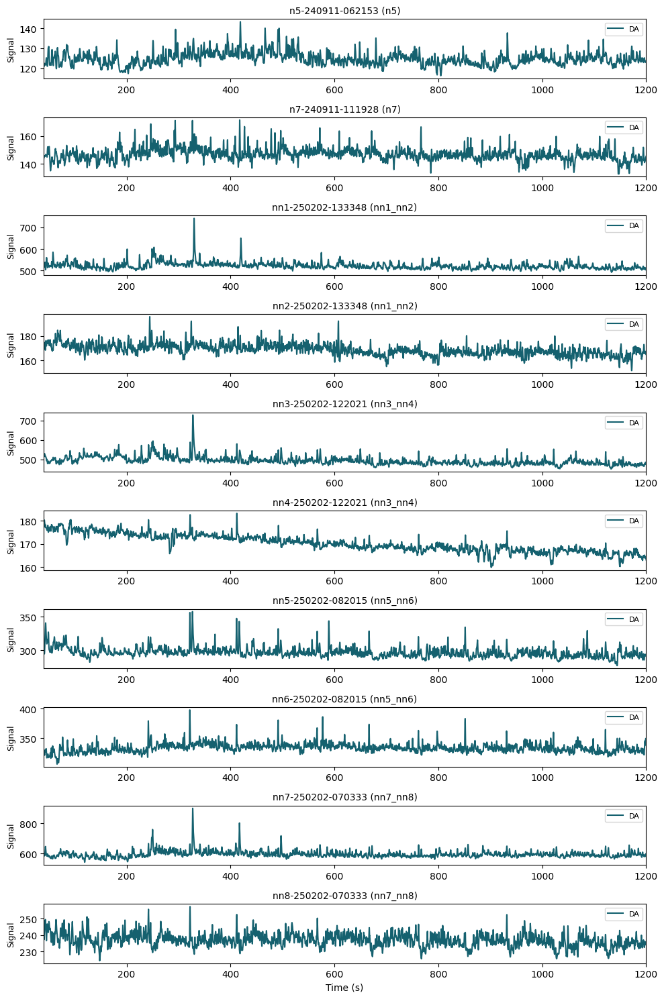

In [20]:
# plot 30→90 s of every NAc session, DA in blue and ISOS in gray
plot_DA_and_ISOS_from_experiment(
    rt_NAc_exp,
    time_window=(40,1200),
    region='NAc',
    figsize_per_trace=(10,1.5),
    da_color='#15616F',
    isos_color='#AAAAAA'
)
